# Keras Applications & Tensorflow Datasets

Using the EfficientNetB0 model from Keras applications with the Food-101 dataset from [Tensorflow datasets](https://tensorflow.google.cn/datasets/overview) to build a food image classifier prediction API.

In [1]:
import datetime
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import random
from sklearn.metrics import accuracy_score, classification_report
import tensorflow as tf
from tensorflow.keras import layers, mixed_precision
import tensorflow_datasets as tfds

2023-03-21 19:07:17.152092: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# import helper functions from helper.py
from helper import (create_tensorboard_callback,
                    create_checkpoint_callback,
                    create_early_stop_callback,
                    create_reduce_learning_rate_callback,
                    plot_accuracy_curves,
                    combine_training_curves,
                    data_augmentation_layer_no_rescaling,
                    plot_confusion_matrix)

2023-03-21 19:07:18.988795: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-21 19:07:19.007501: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-21 19:07:19.008032: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-03-21 19:07:19.008390: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  FMA
To enable them in other operations, rebuild TensorFlow w

In [3]:
# global variables
SEED = 42
BATCH_SIZE = 32
IMG_DIM = 224

## Tensorflow Datasets

> `pip install tensorflow-datasets`

[TFDS Overview](https://www.tensorflow.org/datasets/catalog/overview)


In [ ]:
# list all available datasets
available_datasets = tfds.list_builders()
available_datasets

### Downloading Datasets

In [4]:
# download the food-101 dataset (download size: 4.65 GiB)
# https://www.tensorflow.org/datasets/catalog/food101 

(train_data, test_data), ds_info = tfds.load(name="food101",
                                           split=["train", "validation"],
                                           shuffle_files=True,
                                           as_supervised=True,
                                           with_info=True)

# Dataset food101 downloaded and prepared to /home/myuser/tensorflow_datasets/food101/2.0.0.
# Subsequent calls will reuse this data.

### Exploring the Dataset

In [5]:
# get features
print(ds_info.features)

# FeaturesDict({
#     'image': Image(shape=(None, None, 3), dtype=uint8),
#     'label': ClassLabel(shape=(), dtype=int64, num_classes=101),
# })

# get classnames
class_names = ds_info.features["label"].names
print(class_names[:5])
# ['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare']

FeaturesDict({
    'image': Image(shape=(None, None, 3), dtype=uint8),
    'label': ClassLabel(shape=(), dtype=int64, num_classes=101),
})
['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare']


In [ ]:
# explore trainings data
print(train_data)
# <PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

# get one sample image
train_one_sample = train_data.take(1)
print(train_one_sample)
# <TakeDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

for image, label in train_one_sample:
    print(f"""
        Image Shape: {image.shape}
        Image Datatype: {image.dtype}
        Class Tensor: {label}
        Classname: {class_names[label.numpy()]}
    """)

# images are:
# * 3 colour channels but not standardized to 224x224
# * datatype uint8 needs to be changed (float16/float32)
# * classes are not 1-hot-encoded => sparse-categorical-crossentropy loss-function needed

#     Image Shape: (384, 512, 3)
#     Image Datatype: <dtype: 'uint8'>
#     Class Tensor: 70
#     Classname: pad_thai

In [ ]:
# what do the images look like?
image

# <tf.Tensor: shape=(384, 512, 3), dtype=uint8, numpy=
# array([[[230, 229, 183],
#         [231, 230, 184],
#         [232, 231, 183],

#        ...,
       
#         [243, 245, 224],
#         [244, 246, 225],
#         [245, 247, 226]]], dtype=uint8)>

## min/max values
tf.reduce_min(image), tf.reduce_max(image)

# colour values range from 0 - 255 -> needs to be normalized
# (<tf.Tensor: shape=(), dtype=uint8, numpy=0>,
#  <tf.Tensor: shape=(), dtype=uint8, numpy=255>)

In [ ]:
# plot the image
plt.imshow(image.numpy())
plt.title(class_names[label.numpy()]+ " " + str(image.shape))
plt.axis('off')

![Keras Applications & Tensorflow Datasets](./assets/04_Tensorflow_Transfer_Learning_21.png)

### Preprocess Dataset

* Reshape image `(x, y, 3)` => `(224, 224, 3)`
* Convert dType `unit8` => `float32`
* Normalize (_not necessary for EfficientNet models_)

In [6]:
def preprocess_image(image, label, image_shape=224):
    image = tf.image.resize(image, [image_shape, image_shape])
    # normalization not needed for efficientnet
    # image = image/255
    return tf.cast(image, tf.float32), label

In [ ]:
# test preprocessing function
preprocessed_image = preprocess_image(image, class_names[label.numpy()], image_shape=IMG_DIM)
preprocessed_image

# (<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
#  array([[[229.46939 , 228.46939 , 181.7551  ],
#          [229.59184 , 228.94897 , 180.2347  ],
#          [224.14796 , 224.14796 , 171.71939 ],
 
#         ...,
        
#          [241.79082 , 243.79082 , 222.79082 ],
#          [241.66327 , 243.66327 , 222.66327 ],
#          [242.80103 , 244.80103 , 223.80103 ]]], dtype=float32)>,
#  'pad_thai')

#### Prepare Batched Training/Testing Pipeline

> [Data Performance](https://www.tensorflow.org/guide/data_performance)


* map preprocess function to dataset
* set parallel calls to autotune = use all available threads
* shuffle and batch dataset and set prefetch buffer to autotune

In [7]:
training_dataset = train_data.map(map_func=preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
training_dataset = training_dataset.shuffle(buffer_size=1000).batch(batch_size=BATCH_SIZE).prefetch(buffer_size=tf.data.AUTOTUNE)   

testing_dataset = test_data.map(map_func=preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
testing_dataset = testing_dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

training_dataset, testing_dataset
# (<PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>,
#  <PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>)

(<PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>,
 <PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>)

### Tensorflow Callbacks

In [8]:
# import callbacks from helper.py

## INITIAL TEST
### TensorBoard
tensorboard_dir = '../tensorboard/food101'
experiment_name = 'efficientnetb0_food101_full'

tensorboard_callback = create_tensorboard_callback(tensorboard_dir, experiment_name)

### Checkpoints
checkpoint_dir = '../checkpoints/food101'

checkpoint_callback = create_checkpoint_callback(checkpoint_dir, experiment_name)

                                          
### Early Stop
early_stop_callback = create_early_stop_callback(monitor='val_loss',
                              min_delta=0.0001,
                              patience=10,
                              restore_best_weights=True)

## AUGMENTED TEST
### TensorBoard
experiment_name_augmented = 'efficientnetb0_food101_augmented_full'

tensorboard_augmented_callback = create_tensorboard_callback(tensorboard_dir, experiment_name_augmented)

### Checkpoints
checkpoint_augmented_callback = create_checkpoint_callback(checkpoint_dir, experiment_name_augmented)

                                          
### Reduce Learning Rate
reduce_learning_rate_callback = create_reduce_learning_rate_callback(monitor="val_loss",  
                                        factor=0.2,
                                        patience=2,
                                        min_lr=1e-7)

## V2 MODEL M TEST
### TensorBoard
experiment_name_v2 = 'efficientnetb0_food101_v2_full'

tensorboard_v2_callback = create_tensorboard_callback(tensorboard_dir, experiment_name_v2)

### Checkpoints
checkpoint_v2_callback = create_checkpoint_callback(checkpoint_dir, experiment_name_v2)  


## V2 MODEL B0 TEST
### TensorBoard
experiment_name_v2_b0 = 'efficientnetb0_food101_v2_b0_full'

tensorboard_v2_b0_callback = create_tensorboard_callback(tensorboard_dir, experiment_name_v2)

### Checkpoints
checkpoint_v2_b0_callback = create_checkpoint_callback(checkpoint_dir, experiment_name_v2)                                            

INFO :: Saving TensorBoard Log to: ../tensorboard/food101/efficientnetb0_food101_full/20230321-190756
INFO :: Saving Checkpoint to: ../checkpoints/food101/efficientnetb0_food101_full
INFO :: Early-stop set to: min_delta 0.0001
INFO :: Saving TensorBoard Log to: ../tensorboard/food101/efficientnetb0_food101_augmented_full/20230321-190756
INFO :: Saving Checkpoint to: ../checkpoints/food101/efficientnetb0_food101_augmented_full
INFO :: Reduce learning rate set to: min lr 1e-07
INFO :: Saving TensorBoard Log to: ../tensorboard/food101/efficientnetb0_food101_v2_full/20230321-190756
INFO :: Saving Checkpoint to: ../checkpoints/food101/efficientnetb0_food101_v2_full
INFO :: Saving TensorBoard Log to: ../tensorboard/food101/efficientnetb0_food101_v2_full/20230321-190756
INFO :: Saving Checkpoint to: ../checkpoints/food101/efficientnetb0_food101_v2_full


## Mixed Precision Training

In [9]:
# configure mixed precision training
mixed_precision.set_global_policy("mixed_float16")
mixed_precision.global_policy()

# <Policy "mixed_float16">

# WARNING:tensorflow:Mixed precision compatibility check (mixed_float16): WARNING
# Your GPU may run slowly with dtype policy mixed_float16 because it does not have compute capability of at least 7.0. Your GPU:
#   NVIDIA GeForce GTX 1060 6GB, compute capability 6.1
# See https://developer.nvidia.com/cuda-gpus for a list of GPUs and their compute capabilities.

Your GPU may run slowly with dtype policy mixed_float16 because it does not have compute capability of at least 7.0. Your GPU:
  NVIDIA GeForce GTX 1060 6GB, compute capability 6.1
See https://developer.nvidia.com/cuda-gpus for a list of GPUs and their compute capabilities.
If you will use compatible GPU(s) not attached to this host, e.g. by running a multi-worker model, you can ignore this warning. This message will only be logged once


2023-03-21 19:08:02.340561: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
Your GPU may run slowly with dtype policy mixed_float16 because it does not have compute capability of at least 7.0. Your GPU:
  NVIDIA GeForce GTX 1060 6GB, compute capability 6.1
See https://developer.nvidia.com/cuda-gpus for a list of GPUs and their compute capabilities.
If you will use compatible GPU(s) not attached to this host, e.g. by running a multi-worker model, you can ignore this warning. This message will only be logged once


<Policy "mixed_float16">

In [11]:
# load the base model
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

In [12]:
# create functional model
inputs = layers.Input(shape=(IMG_DIM, IMG_DIM, 3), name="input_layer")
# normalization not needed for EfficientNet models
# x = layers.Rescaling(1./255)(x)
# freeze base layers in inference mode
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(len(class_names))(x)
# mixed precision requires outputlayer to be of dtype = tf.float32
# above mixed mixed float16 / below float32 separation
outputs = layers.Activation("softmax", dtype=tf.float32, name="softmax_output_float32")(x)
model = tf.keras.Model(inputs, outputs)

# labels are not 1-hot encoded => sparse_categorical instead of categorical
model.compile(loss="sparse_categorical_crossentropy",
             optimizer= tf.keras.optimizers.Adam(learning_rate=1e-3),
             metrics=["accuracy"])

In [ ]:
print(model.summary())

# Model: "model_1"
# _________________________________________________________________
#  Layer (type)                Output Shape              Param #   
# =================================================================
#  input_layer (InputLayer)    [(None, 224, 224, 3)]     0
#  efficientnetb0 (Functional)  (None, None, None, 1280)  4049571
#  global_average_pooling2d_3   (None, 1280)             0         
#  (GlobalAveragePooling2D)
#  dense_3 (Dense)             (None, 101)               129381
#  softmax_output_float32 (Act  (None, 101)              0         
#  ivation)
# =================================================================
# Total params: 4,178,952
# Trainable params: 129,381
# Non-trainable params: 4,049,571
# _________________________________________________________________

for layer in model.layers:
    print(layer.name, layer.trainable, layer.dtype, layer.dtype_policy)
    
# input_layer True float32 <Policy "float32">
# efficientnetb0 False float32 <Policy "mixed_float16">
# global_average_pooling2d_3 True float32 <Policy "mixed_float16">
# dense_3 True float32 <Policy "mixed_float16">
# softmax_output_float32 True float32 <Policy "float32">

### Training Run

In [14]:
tf.random.set_seed(SEED)
feature_extraction_epochs = 5

feature_extraction_history = model.fit(training_dataset,
                                         epochs=feature_extraction_epochs,
                                         steps_per_epoch=len(training_dataset),
                                         validation_data=testing_dataset,
                                         # evaluate performance on 15% of the testing dataset
                                         validation_steps=int(0.15 * len(testing_dataset)),
                                         callbacks=[tensorboard_callback,
                                                    checkpoint_callback,
                                                    early_stop_callback])

# Epoch 1/5
# 221s 89ms/step - loss: 1.7176 - accuracy: 0.5821 - val_loss: 1.1405 - val_accuracy: 0.6891
# Epoch 2/5
# 206s 87ms/step - loss: 1.1998 - accuracy: 0.6892 - val_loss: 1.0268 - val_accuracy: 0.7156
# Epoch 3/5
# 215s 91ms/step - loss: 1.0541 - accuracy: 0.7243 - val_loss: 0.9917 - val_accuracy: 0.7317
# Epoch 4/5
# 216s 91ms/step - loss: 0.9598 - accuracy: 0.7468 - val_loss: 0.9809 - val_accuracy: 0.7296
# Epoch 5/5
# 213s 90ms/step - loss: 0.8884 - accuracy: 0.7657 - val_loss: 0.9658 - val_accuracy: 0.7378

Epoch 1/5


2023-03-20 13:08:12.718614: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8600
2023-03-20 13:08:15.980732: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7fae7401d3c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-03-20 13:08:15.980749: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA GeForce GTX 1060 6GB, Compute Capability 6.1
2023-03-20 13:08:15.996615: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-03-20 13:08:16.001384: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.
2023-03-20 13:08:16.155181: I tensorflow/compiler/jit/xla_compilation_cache.cc:477] Compiled cluster using XLA!  This line is logged at most o

2368/2368 [==============================] - 221s 89ms/step - loss: 1.7176 - accuracy: 0.5821 - val_loss: 1.1405 - val_accuracy: 0.6891
Epoch 2/5
2368/2368 [==============================] - 206s 87ms/step - loss: 1.1998 - accuracy: 0.6892 - val_loss: 1.0268 - val_accuracy: 0.7156
Epoch 3/5
2368/2368 [==============================] - 215s 91ms/step - loss: 1.0541 - accuracy: 0.7243 - val_loss: 0.9917 - val_accuracy: 0.7317
Epoch 4/5
2368/2368 [==============================] - 216s 91ms/step - loss: 0.9598 - accuracy: 0.7468 - val_loss: 0.9809 - val_accuracy: 0.7296
Epoch 5/5
2368/2368 [==============================] - 213s 90ms/step - loss: 0.8884 - accuracy: 0.7657 - val_loss: 0.9658 - val_accuracy: 0.7378


In [15]:
feature_extraction_results = model.evaluate(testing_dataset)
print(feature_extraction_results)

# [0.9763504266738892, 0.7352079153060913]

790/790 [==============================] - 62s 79ms/step - loss: 0.9764 - accuracy: 0.7352


[0.9763504266738892, 0.7352079153060913]

### Model Fine-tuning

In [16]:
# unfreeze entire model
base_model.trainable = True

# keep only the last 5 layers trainable
for layer in base_model.layers[:-5]:
    layer.trainable = False

In [17]:
# recompile the model with the new basemodel
### to prevent overfitting / to better hold on to pre-training
### the learning rate during fine-tuning should be lowered 10x
### default Adam(lr)=1e-3 => 1e-4
model.compile(loss='sparse_categorical_crossentropy',
               optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
               metrics=['accuracy'])

In [18]:
# continue training
tf.random.set_seed(SEED)
fine_tuning_epochs = feature_extraction_epochs + 5

fine_tuning_history = model.fit(
                            training_dataset,
                            epochs=fine_tuning_epochs,
                            # start from last pre-training checkpoint
                            # training from epoch 6 - 10
                            initial_epoch = feature_extraction_history.epoch[-1],
                            steps_per_epoch=len(training_dataset),
                            validation_data=testing_dataset,
                            # evaluate performance on 15% of the testing dataset
                            validation_steps=int(0.15 * len(testing_dataset)),
                            callbacks=[tensorboard_callback,
                                       checkpoint_callback])

# Epoch 5/10
# 227s 93ms/step - loss: 0.7658 - accuracy: 0.7958 - val_loss: 0.9151 - val_accuracy: 0.7476
# Epoch 6/10
# 226s 95ms/step - loss: 0.6486 - accuracy: 0.8283 - val_loss: 0.9096 - val_accuracy: 0.7476
# Epoch 7/10
# 225s 95ms/step - loss: 0.5643 - accuracy: 0.8527 - val_loss: 0.9090 - val_accuracy: 0.7516
# Epoch 8/10
# 225s 95ms/step - loss: 0.4946 - accuracy: 0.8738 - val_loss: 0.9063 - val_accuracy: 0.7564
# Epoch 9/10
# 231s 97ms/step - loss: 0.4352 - accuracy: 0.8914 - val_loss: 0.9164 - val_accuracy: 0.7585
# Epoch 10/10
# 233s 98ms/step - loss: 0.3821 - accuracy: 0.9061 - val_loss: 0.9256 - val_accuracy: 0.7569


Epoch 5/10
2368/2368 [==============================] - 227s 93ms/step - loss: 0.7658 - accuracy: 0.7958 - val_loss: 0.9151 - val_accuracy: 0.7476
Epoch 6/10
2368/2368 [==============================] - 226s 95ms/step - loss: 0.6486 - accuracy: 0.8283 - val_loss: 0.9096 - val_accuracy: 0.7476
Epoch 7/10
2368/2368 [==============================] - 225s 95ms/step - loss: 0.5643 - accuracy: 0.8527 - val_loss: 0.9090 - val_accuracy: 0.7516
Epoch 8/10
2368/2368 [==============================] - 225s 95ms/step - loss: 0.4946 - accuracy: 0.8738 - val_loss: 0.9063 - val_accuracy: 0.7564
Epoch 9/10
2368/2368 [==============================] - 231s 97ms/step - loss: 0.4352 - accuracy: 0.8914 - val_loss: 0.9164 - val_accuracy: 0.7585
Epoch 10/10
2368/2368 [==============================] - 233s 98ms/step - loss: 0.3821 - accuracy: 0.9061 - val_loss: 0.9256 - val_accuracy: 0.7569


In [19]:
# evaluate performance on whole dataset
fine_tuning_results = model.evaluate(testing_dataset)
print(fine_tuning_results)

# Feature Extraction
# [0.9763504266738892, 0.7352079153060913]
# Fine-Tuning
# [0.9353731274604797, 0.7551287412643433]

790/790 [==============================] - 61s 77ms/step - loss: 0.9354 - accuracy: 0.7551
[0.9353731274604797, 0.7551287412643433]


### Model Evaluation

#### Accuracy and Loss

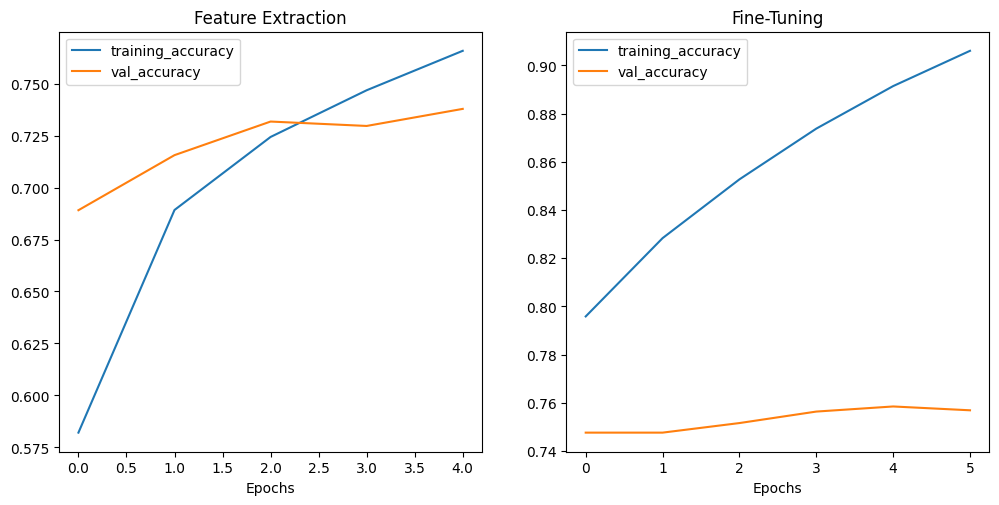

In [20]:
# print accuracy curves
plot_accuracy_curves(feature_extraction_history, "Feature Extraction", fine_tuning_history, "Fine-Tuning")

![Keras Applications & Tensorflow Datasets](./assets/04_Tensorflow_Transfer_Learning_22.png)

5
11
[0.5821254253387451, 0.689201295375824, 0.7243168354034424, 0.746772289276123, 0.7657425999641418, 0.7958415746688843, 0.8283300399780273, 0.8527261018753052, 0.8737821578979492, 0.8914323449134827, 0.9060726165771484]


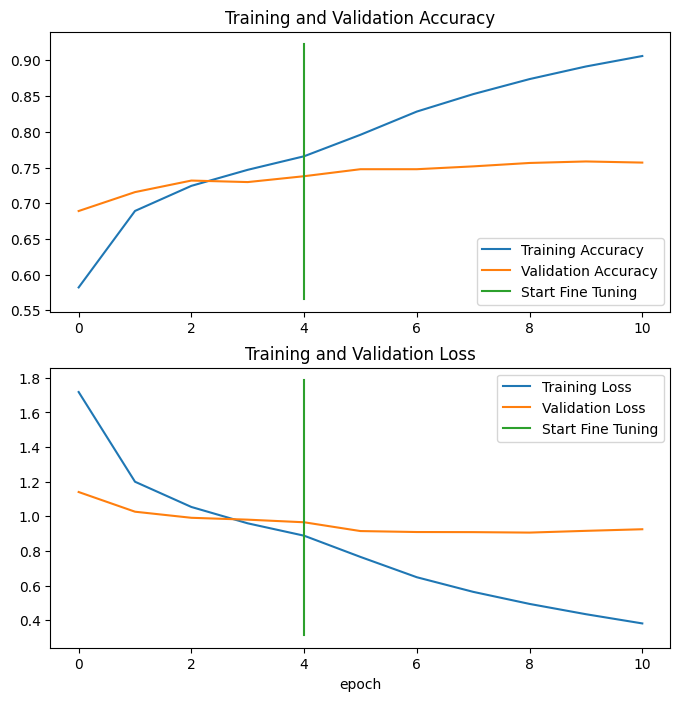

In [22]:
# the validation accuracy increase keeps slowing while training
# accuracy goes up this points to an overfitting problem
combine_training_curves(feature_extraction_history, fine_tuning_history, pretraining_epochs=5)

![Keras Applications & Tensorflow Datasets](./assets/04_Tensorflow_Transfer_Learning_23.png)

#### Predictions

In [31]:
y_pred = []  # store predicted labels
y_true = []  # store true labels

# iterate over the dataset
for image_batch, label_batch in testing_dataset:   # use dataset.unbatch() with repeat
   # append true labels
   y_true.append(label_batch)
   # compute predictions
   preds = model.predict(image_batch)
   # append predicted labels
   y_pred.append(np.argmax(preds, axis = - 1))

# convert the true and predicted labels into tensors
correct_labels = tf.concat([item for item in y_true], axis = 0)
predicted_labels = tf.concat([item for item in y_pred], axis = 0)

correct_labels, predicted_labels

# (<tf.Tensor: shape=(25250,), dtype=int64, numpy=array([37, 99, 40, ..., 56, 46, 89])>,
#  <tf.Tensor: shape=(25250,), dtype=int64, numpy=array([37, 36, 40, ..., 11, 46, 89])>)

1/1 [==============================] - 0s 23ms/step


1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 1s 1s/step


(<tf.Tensor: shape=(25250,), dtype=int64, numpy=array([37, 99, 40, ..., 56, 46, 89])>,
 <tf.Tensor: shape=(25250,), dtype=int64, numpy=array([37, 36, 40, ..., 11, 46, 89])>)

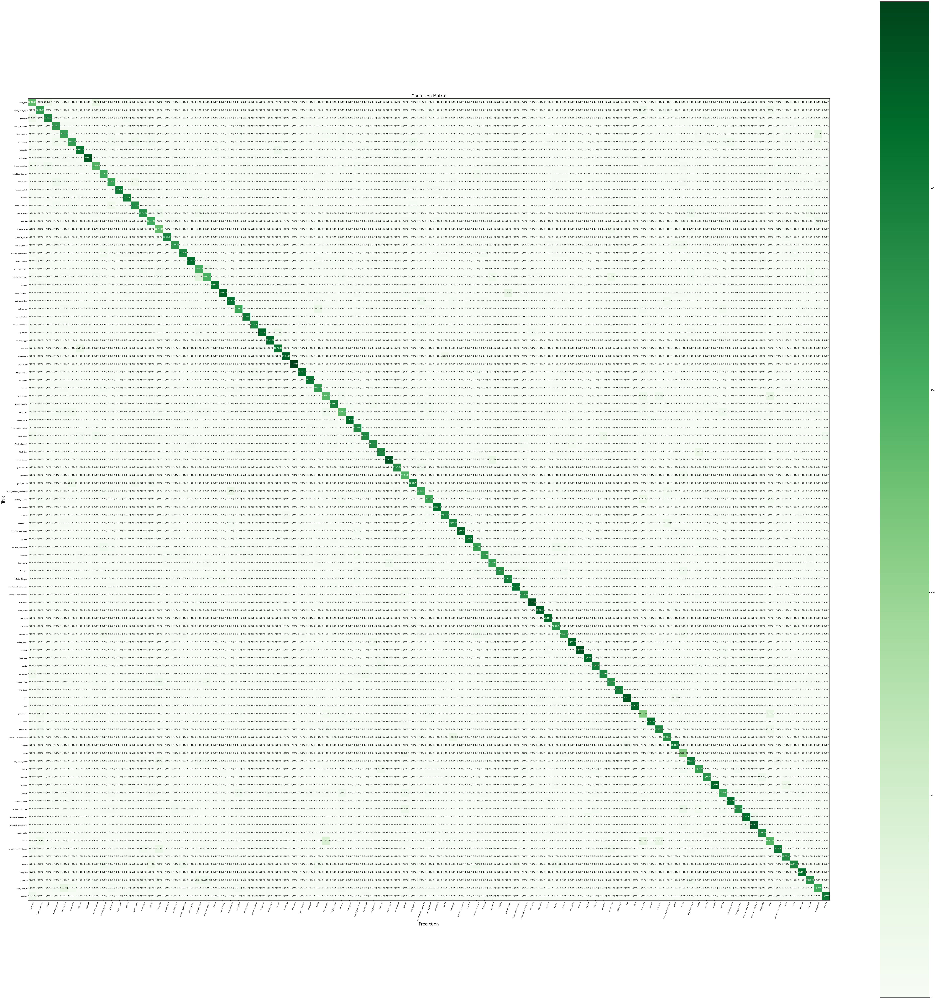

In [32]:
plot_confusion_matrix(y_pred=predicted_labels,
                      y_true=correct_labels,
                      classes=class_names,
                      figsize = (88, 88),
                      text_size=8)

![Keras Applications & Tensorflow Datasets](./assets/04_Tensorflow_Transfer_Learning_24.png)

In [33]:
# Load TensorBoard
%load_ext tensorboard
%tensorboard --logdir '../tensorboard/food101/'

![Keras Applications & Tensorflow Datasets](./assets/04_Tensorflow_Transfer_Learning_25.png)

![Keras Applications & Tensorflow Datasets](./assets/04_Tensorflow_Transfer_Learning_26.png)

## Input Data Augmentation

Using Tensorflow image augmentation function to "virtually" diversify the dataset and tackling the overfitting issue.

In [37]:
# helper function to create an augmented model
data_augmentation_layer_no_rescaling = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(0.2),
    tf.keras.layers.RandomTranslation(
            height_factor=(-0.2, 0.3),
            width_factor=(-0.2, 0.3),
            fill_mode='reflect',
            interpolation='bilinear'),
    tf.keras.layers.RandomContrast(0.2),
    tf.keras.layers.RandomBrightness(0.2)
], name="data_augmentation")

In [46]:
# load the base model a second time
base_model_augmented = tf.keras.applications.EfficientNetB0(include_top=False)
base_model_augmented.trainable = False

In [47]:
# create augmented functional model
inputs = layers.Input(shape=(IMG_DIM, IMG_DIM, 3), name="input_layer")
x = data_augmentation_layer_no_rescaling(inputs)
# normalization not needed for EfficientNet models
# x = layers.Rescaling(1./255)(x)
# freeze base layers in inference mode
x = base_model_augmented(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(len(class_names))(x)
# mixed precision requires outputlayer to be of dtype = tf.float32
# above mixed mixed float16 / below float32 separation
outputs = layers.Activation("softmax", dtype=tf.float32, name="softmax_output_float32")(x)
model2_augmented = tf.keras.Model(inputs, outputs)

# labels are not 1-hot encoded => sparse_categorical instead of categorical
model2_augmented.compile(loss="sparse_categorical_crossentropy",
             optimizer= tf.keras.optimizers.Adam(learning_rate=1e-3),
             metrics=["accuracy"])

In [48]:
tf.random.set_seed(SEED)
feature_extraction_augmented_epochs = 5

feature_extraction_augmented_history = model2_augmented.fit(training_dataset,
                                             epochs=feature_extraction_epochs,
                                             steps_per_epoch=len(training_dataset),
                                             validation_data=testing_dataset,
                                             # evaluate performance on 15% of the testing dataset
                                             validation_steps=int(0.15 * len(testing_dataset)),
                                             callbacks=[tensorboard_augmented_callback,
                                                        checkpoint_augmented_callback,
                                                        reduce_learning_rate_callback,
                                                        early_stop_callback])

# Epoch 1/5
# 2368/2368 [==============================] - 647s 269ms/step - loss: 2.5783 - accuracy: 0.3880 - val_loss: 1.6074 - val_accuracy: 0.5792 - lr: 0.0010
# Epoch 2/5
# 591s 249ms/step - loss: 2.0982 - accuracy: 0.4789 - val_loss: 1.4961 - val_accuracy: 0.5927 - lr: 0.0010
# Epoch 3/5
# 581s 245ms/step - loss: 1.9760 - accuracy: 0.5060 - val_loss: 1.4502 - val_accuracy: 0.6001 - lr: 0.0010
# Epoch 4/5
# 580s 245ms/step - loss: 1.9136 - accuracy: 0.5202 - val_loss: 1.4311 - val_accuracy: 0.6147 - lr: 0.0010
# Epoch 5/5
# 594s 251ms/step - loss: 1.8632 - accuracy: 0.5288 - val_loss: 1.4012 - val_accuracy: 0.6160 - lr: 0.0010

Epoch 1/5


2368/2368 [==============================] - 647s 269ms/step - loss: 2.5783 - accuracy: 0.3880 - val_loss: 1.6074 - val_accuracy: 0.5792 - lr: 0.0010
Epoch 2/5
2368/2368 [==============================] - 591s 249ms/step - loss: 2.0982 - accuracy: 0.4789 - val_loss: 1.4961 - val_accuracy: 0.5927 - lr: 0.0010
Epoch 3/5
2368/2368 [==============================] - 581s 245ms/step - loss: 1.9760 - accuracy: 0.5060 - val_loss: 1.4502 - val_accuracy: 0.6001 - lr: 0.0010
Epoch 4/5
2368/2368 [==============================] - 580s 245ms/step - loss: 1.9136 - accuracy: 0.5202 - val_loss: 1.4311 - val_accuracy: 0.6147 - lr: 0.0010
Epoch 5/5
2368/2368 [==============================] - 594s 251ms/step - loss: 1.8632 - accuracy: 0.5288 - val_loss: 1.4012 - val_accuracy: 0.6160 - lr: 0.0010


In [49]:
# unfreeze entire model
base_model_augmented.trainable = True

# keep only the last 5 layers trainable
for layer in base_model_augmented.layers[:-5]:
    layer.trainable = False

In [50]:
# recompile the model with the new basemodel
model2_augmented.compile(loss='sparse_categorical_crossentropy',
               optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
               metrics=['accuracy'])

In [51]:
# continue training
tf.random.set_seed(SEED)
fine_tuning_augmented_epochs = feature_extraction_augmented_epochs + 5

fine_tuning_augmented_history = model2_augmented.fit(
                            training_dataset,
                            epochs=fine_tuning_augmented_epochs,
                            # start from last pre-training checkpoint
                            # training from epoch 6 - 10
                            initial_epoch = feature_extraction_augmented_history.epoch[-1],
                            steps_per_epoch=len(training_dataset),
                            validation_data=testing_dataset,
                            # evaluate performance on 15% of the testing dataset
                            validation_steps=int(0.15 * len(testing_dataset)),
                            callbacks=[tensorboard_augmented_callback,
                                       checkpoint_augmented_callback,
                                       reduce_learning_rate_callback,
                                       early_stop_callback])

# Epoch 5/10
# 2368/2368 [==============================] - 699s 290ms/step - loss: 1.6879 - accuracy: 0.5703 - val_loss: 1.3540 - val_accuracy: 0.6316 - lr: 1.0000e-04
# Epoch 6/10
# 661s 279ms/step - loss: 1.5625 - accuracy: 0.5996 - val_loss: 1.3304 - val_accuracy: 0.6380 - lr: 1.0000e-04
# Epoch 7/10
# 712s 300ms/step - loss: 1.4884 - accuracy: 0.6163 - val_loss: 1.3158 - val_accuracy: 0.6414 - lr: 1.0000e-04
# Epoch 8/10
# 710s 299ms/step - loss: 1.4279 - accuracy: 0.6287 - val_loss: 1.2938 - val_accuracy: 0.6486 - lr: 1.0000e-04
# Epoch 9/10
# 713s 300ms/step - loss: 1.3782 - accuracy: 0.6402 - val_loss: 1.2849 - val_accuracy: 0.6499 - lr: 1.0000e-04
# Epoch 10/10
# 714s 301ms/step - loss: 1.3448 - accuracy: 0.6497 - val_loss: 1.2670 - val_accuracy: 0.6510 - lr: 1.0000e-04


Epoch 5/10


2368/2368 [==============================] - 699s 290ms/step - loss: 1.6879 - accuracy: 0.5703 - val_loss: 1.3540 - val_accuracy: 0.6316 - lr: 1.0000e-04
Epoch 6/10
2368/2368 [==============================] - 661s 279ms/step - loss: 1.5625 - accuracy: 0.5996 - val_loss: 1.3304 - val_accuracy: 0.6380 - lr: 1.0000e-04
Epoch 7/10
2368/2368 [==============================] - 712s 300ms/step - loss: 1.4884 - accuracy: 0.6163 - val_loss: 1.3158 - val_accuracy: 0.6414 - lr: 1.0000e-04
Epoch 8/10
2368/2368 [==============================] - 710s 299ms/step - loss: 1.4279 - accuracy: 0.6287 - val_loss: 1.2938 - val_accuracy: 0.6486 - lr: 1.0000e-04
Epoch 9/10
2368/2368 [==============================] - 713s 300ms/step - loss: 1.3782 - accuracy: 0.6402 - val_loss: 1.2849 - val_accuracy: 0.6499 - lr: 1.0000e-04
Epoch 10/10
2368/2368 [==============================] - 714s 301ms/step - loss: 1.3448 - accuracy: 0.6497 - val_loss: 1.2670 - val_accuracy: 0.6510 - lr: 1.0000e-04


### Model Evaluation

#### Accuracy and Loss

5
11
[0.38801321387290955, 0.4788910746574402, 0.5060065984725952, 0.5202244520187378, 0.5287920832633972, 0.5702705979347229, 0.5995907783508301, 0.6163168549537659, 0.6286600828170776, 0.6401848196983337, 0.6497293710708618]


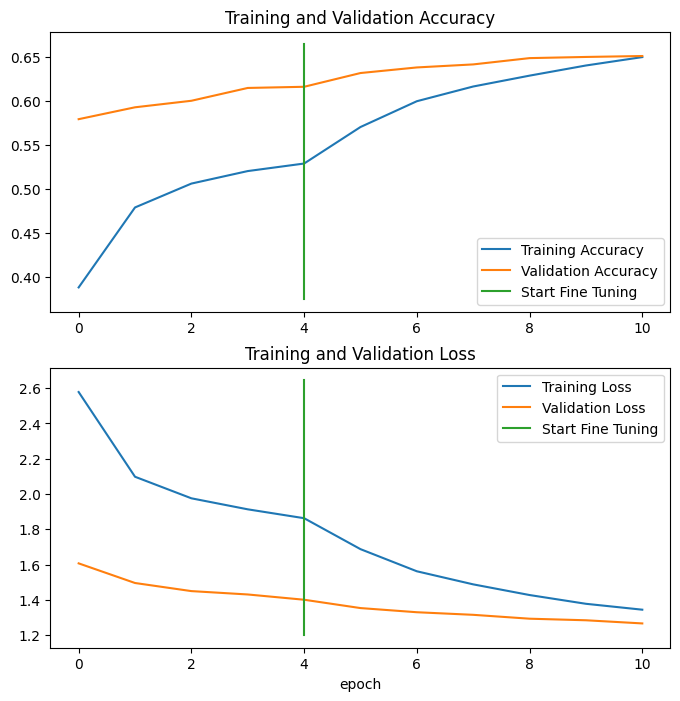

In [52]:
# the validation accuracy increase keeps slowing while training
combine_training_curves(feature_extraction_augmented_history, fine_tuning_augmented_history, pretraining_epochs=5)

![Keras Applications & Tensorflow Datasets](./assets/04_Tensorflow_Transfer_Learning_27.png)

![Keras Applications & Tensorflow Datasets](./assets/nice.gif)

## Base Model Complexity

Even though the model above lead to a worse accuracy over 5+5 epochs it seems to have solved the overfitting issue. Both the training and validation metrics stick together and keep on improving slowly. We can keep this model running for longer time and the accuracy will keep on rising.


But before running this on a night shift I want to first try out a slightly complexer version of the EfficientNet model. I also noticed that I used [version 1](https://www.tensorflow.org/api_docs/python/tf/keras/applications/efficientnet/EfficientNetB0) instead of [version 2](https://www.tensorflow.org/api_docs/python/tf/keras/applications/efficientnet_v2/EfficientNetV2B0).


Version 2 of EfficientNet offers a small, medium and large model. According to [this paper](https://arxiv.org/abs/2104.00298) the medium model offers a much higher accuracy without a significant increase in parameters:


![EfficientNetV2: Smaller Models and Faster Training](../assets/04_Tensorflow_Transfer_Learning_28.png)

In [13]:
# load the version 2 base model
base_model_v2 = tf.keras.applications.efficientnet_v2.EfficientNetV2M(include_top=False)
base_model_v2.trainable = False

In [14]:
# create augmented functional model
inputs = layers.Input(shape=(IMG_DIM, IMG_DIM, 3), name="input_layer")
x = data_augmentation_layer_no_rescaling(inputs)
# normalization not needed for EfficientNet models
# x = layers.Rescaling(1./255)(x)
# freeze base layers in inference mode
x = base_model_v2(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(len(class_names))(x)
# mixed precision requires outputlayer to be of dtype = tf.float32
# above mixed mixed float16 / below float32 separation
outputs = layers.Activation("softmax", dtype=tf.float32, name="softmax_output_float32")(x)
model_v2 = tf.keras.Model(inputs, outputs)

# labels are not 1-hot encoded => sparse_categorical instead of categorical
model_v2.compile(loss="sparse_categorical_crossentropy",
             optimizer= tf.keras.optimizers.Adam(learning_rate=1e-3),
             metrics=["accuracy"])

In [56]:
tf.random.set_seed(SEED)
feature_extraction_v2_epochs = 5

feature_extraction_v2_history = model_v2.fit(training_dataset,
                                             epochs=feature_extraction_v2_epochs,
                                             steps_per_epoch=len(training_dataset),
                                             validation_data=testing_dataset,
                                             # evaluate performance on 15% of the testing dataset
                                             validation_steps=int(0.15 * len(testing_dataset)),
                                             callbacks=[tensorboard_v2_callback,
                                                        checkpoint_v2_callback,
                                                        reduce_learning_rate_callback,
                                                        early_stop_callback])


# Epoch 1/5
# 1205s 498ms/step - loss: 2.7086 - accuracy: 0.3647 - val_loss: 1.6947 - val_accuracy: 0.5535 - lr: 0.0010
# Epoch 2/5
# 1166s 492ms/step - loss: 2.2371 - accuracy: 0.4511 - val_loss: 1.5539 - val_accuracy: 0.5842 - lr: 0.0010
# Epoch 3/5
# 1168s 493ms/step - loss: 2.1267 - accuracy: 0.4738 - val_loss: 1.4823 - val_accuracy: 0.6030 - lr: 0.0010
# Epoch 4/5
# 1166s 492ms/step - loss: 2.0640 - accuracy: 0.4877 - val_loss: 1.4556 - val_accuracy: 0.6102 - lr: 0.0010
# Epoch 5/5
# 1156s 488ms/step - loss: 2.0266 - accuracy: 0.4951 - val_loss: 1.4178 - val_accuracy: 0.6147 - lr: 0.0010

Epoch 1/5


2368/2368 [==============================] - 1205s 498ms/step - loss: 2.7086 - accuracy: 0.3647 - val_loss: 1.6947 - val_accuracy: 0.5535 - lr: 0.0010
Epoch 2/5
2368/2368 [==============================] - 1166s 492ms/step - loss: 2.2371 - accuracy: 0.4511 - val_loss: 1.5539 - val_accuracy: 0.5842 - lr: 0.0010
Epoch 3/5
2368/2368 [==============================] - 1168s 493ms/step - loss: 2.1267 - accuracy: 0.4738 - val_loss: 1.4823 - val_accuracy: 0.6030 - lr: 0.0010
Epoch 4/5
2368/2368 [==============================] - 1166s 492ms/step - loss: 2.0640 - accuracy: 0.4877 - val_loss: 1.4556 - val_accuracy: 0.6102 - lr: 0.0010
Epoch 5/5
2368/2368 [==============================] - 1156s 488ms/step - loss: 2.0266 - accuracy: 0.4951 - val_loss: 1.4178 - val_accuracy: 0.6147 - lr: 0.0010


In [57]:
# unfreeze entire model
base_model_v2.trainable = True

# keep only the last 5 layers trainable
for layer in base_model_v2.layers[:-5]:
    layer.trainable = False

In [58]:
# recompile the model with the new basemodel
model_v2.compile(loss='sparse_categorical_crossentropy',
               optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
               metrics=['accuracy'])

In [59]:
# continue training
tf.random.set_seed(SEED)
fine_tuning_v2_epochs = feature_extraction_v2_epochs + 25

fine_tuning_v2_history = model_v2.fit(
                            training_dataset,
                            epochs=fine_tuning_v2_epochs,
                            # start from last pre-training checkpoint
                            # training from epoch 6 - 10
                            initial_epoch = feature_extraction_v2_history.epoch[-1],
                            steps_per_epoch=len(training_dataset),
                            validation_data=testing_dataset,
                            # evaluate performance on 15% of the testing dataset
                            validation_steps=int(0.15 * len(testing_dataset)),
                            callbacks=[tensorboard_v2_callback,
                                       checkpoint_v2_callback,
                                       reduce_learning_rate_callback,
                                       early_stop_callback])

# Epoch 5/10
# 1150s 478ms/step - loss: 2.1729 - accuracy: 0.4661 - val_loss: 1.3997 - val_accuracy: 0.6247 - lr: 1.0000e-04
# Epoch 6/30
# 1140s 481ms/step - loss: 2.0175 - accuracy: 0.4981 - val_loss: 1.3611 - val_accuracy: 0.6356 - lr: 1.0000e-04
# Epoch 7/30
# 1085s 457ms/step - loss: 1.9182 - accuracy: 0.5221 - val_loss: 1.3154 - val_accuracy: 0.6446 - lr: 1.0000e-04
# Epoch 8/30
# 1081s 456ms/step - loss: 1.8463 - accuracy: 0.5368 - val_loss: 1.2975 - val_accuracy: 0.6541 - lr: 1.0000e-04
# Epoch 9/30
# 1077s 454ms/step - loss: 1.7945 - accuracy: 0.5471 - val_loss: 1.2966 - val_accuracy: 0.6568 - lr: 1.0000e-04
# Epoch 10/30
# 1074s 453ms/step - loss: 1.7426 - accuracy: 0.5586 - val_loss: 1.2826 - val_accuracy: 0.6523 - lr: 1.0000e-04
# Epoch 11/30
# 1057s 446ms/step - loss: 1.6953 - accuracy: 0.5717 - val_loss: 1.2742 - val_accuracy: 0.6547 - lr: 1.0000e-04
# Epoch 12/30
# 1076s 454ms/step - loss: 1.6599 - accuracy: 0.5778 - val_loss: 1.2551 - val_accuracy: 0.6623 - lr: 1.0000e-04
# Epoch 13/30
# 1076s 454ms/step - loss: 1.6280 - accuracy: 0.5824 - val_loss: 1.2380 - val_accuracy: 0.6653 - lr: 1.0000e-04
# Epoch 14/30
# 1077s 454ms/step - loss: 1.5995 - accuracy: 0.5925 - val_loss: 1.2231 - val_accuracy: 0.6684 - lr: 1.0000e-04
# Epoch 15/30
# 1078s 454ms/step - loss: 1.5727 - accuracy: 0.5966 - val_loss: 1.2322 - val_accuracy: 0.6647 - lr: 1.0000e-04
# Epoch 16/30
# ETA: 0s - loss: 1.5447 - accuracy: 0.6035
# Epoch 16: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.
# 1068s 451ms/step - loss: 1.5447 - accuracy: 0.6035 - val_loss: 1.2362 - val_accuracy: 0.6660 - lr: 1.0000e-04
# Epoch 17/30
# 1066s 450ms/step - loss: 1.4947 - accuracy: 0.6157 - val_loss: 1.2064 - val_accuracy: 0.6724 - lr: 2.0000e-05
# Epoch 18/30
# 1072s 452ms/step - loss: 1.4733 - accuracy: 0.6204 - val_loss: 1.2000 - val_accuracy: 0.6766 - lr: 2.0000e-05
# Epoch 19/30
# 1066s 450ms/step - loss: 1.4703 - accuracy: 0.6206 - val_loss: 1.1957 - val_accuracy: 0.6785 - lr: 2.0000e-05
# Epoch 20/30
# 1072s 452ms/step - loss: 1.4599 - accuracy: 0.6233 - val_loss: 1.1900 - val_accuracy: 0.6822 - lr: 2.0000e-05
# Epoch 21/30
# 1075s 453ms/step - loss: 1.4523 - accuracy: 0.6256 - val_loss: 1.1865 - val_accuracy: 0.6819 - lr: 2.0000e-05
# Epoch 22/30
# 1075s 454ms/step - loss: 1.4456 - accuracy: 0.6251 - val_loss: 1.1806 - val_accuracy: 0.6806 - lr: 2.0000e-05
# Epoch 23/30
# 1075s 454ms/step - loss: 1.4428 - accuracy: 0.6252 - val_loss: 1.1841 - val_accuracy: 0.6838 - lr: 2.0000e-05
# Epoch 24/30
# ETA: 0s - loss: 1.4355 - accuracy: 0.6271
# Epoch 24: ReduceLROnPlateau reducing learning rate to 3.999999898951501e-06.
# 1072s 452ms/step - loss: 1.4355 - accuracy: 0.6271 - val_loss: 1.1831 - val_accuracy: 0.6790 - lr: 2.0000e-05
# Epoch 25/30
# 1082s 457ms/step - loss: 1.4297 - accuracy: 0.6292 - val_loss: 1.1781 - val_accuracy: 0.6838 - lr: 4.0000e-06
# Epoch 26/30
# 1064s 449ms/step - loss: 1.4326 - accuracy: 0.6290 - val_loss: 1.1777 - val_accuracy: 0.6811 - lr: 4.0000e-06
# Epoch 27/30
# 1069s 451ms/step - loss: 1.4278 - accuracy: 0.6313 - val_loss: 1.1799 - val_accuracy: 0.6814 - lr: 4.0000e-06
# Epoch 28/30
# ETA: 0s - loss: 1.4149 - accuracy: 0.6343
# Epoch 28: ReduceLROnPlateau reducing learning rate to 7.999999979801942e-07.
# 1082s 457ms/step - loss: 1.4149 - accuracy: 0.6343 - val_loss: 1.1794 - val_accuracy: 0.6846 - lr: 4.0000e-06
# Epoch 29/30
# 1082s 456ms/step - loss: 1.4229 - accuracy: 0.6332 - val_loss: 1.1767 - val_accuracy: 0.6854 - lr: 8.0000e-07
# Epoch 30/30
# 1081s 456ms/step - loss: 1.4176 - accuracy: 0.6320 - val_loss: 1.1780 - val_accuracy: 0.6851 - lr: 8.0000e-07

Epoch 5/30


2368/2368 [==============================] - 1150s 478ms/step - loss: 2.1729 - accuracy: 0.4661 - val_loss: 1.3997 - val_accuracy: 0.6247 - lr: 1.0000e-04
Epoch 6/30
2368/2368 [==============================] - 1140s 481ms/step - loss: 2.0175 - accuracy: 0.4981 - val_loss: 1.3611 - val_accuracy: 0.6356 - lr: 1.0000e-04
Epoch 7/30
2368/2368 [==============================] - 1085s 457ms/step - loss: 1.9182 - accuracy: 0.5221 - val_loss: 1.3154 - val_accuracy: 0.6446 - lr: 1.0000e-04
Epoch 8/30
2368/2368 [==============================] - 1081s 456ms/step - loss: 1.8463 - accuracy: 0.5368 - val_loss: 1.2975 - val_accuracy: 0.6541 - lr: 1.0000e-04
Epoch 9/30
2368/2368 [==============================] - 1077s 454ms/step - loss: 1.7945 - accuracy: 0.5471 - val_loss: 1.2966 - val_accuracy: 0.6568 - lr: 1.0000e-04
Epoch 10/30
2368/2368 [==============================] - 1074s 453ms/step - loss: 1.7426 - accuracy: 0.5586 - val_loss: 1.2826 - val_accuracy: 0.6523 - lr: 1.0000e-04
Epoch 11/30
23

### Model Evaluation

#### Accuracy and Loss

5
31
[0.36472606658935547, 0.45111551880836487, 0.4738217890262604, 0.48768317699432373, 0.4950627088546753, 0.46607261896133423, 0.4981254041194916, 0.5221385955810547, 0.5367920994758606, 0.5470759272575378, 0.5585610270500183, 0.5716567635536194, 0.577782154083252, 0.5823630094528198, 0.5925016403198242, 0.5965940356254578, 0.6034983396530151, 0.6156567931175232, 0.6204356551170349, 0.6205940842628479, 0.6232871413230896, 0.6255577802658081, 0.6250560879707336, 0.6252013444900513, 0.6271287202835083, 0.6292409300804138, 0.6290032863616943, 0.6313399076461792, 0.6343498229980469, 0.63321453332901, 0.6319867968559265]


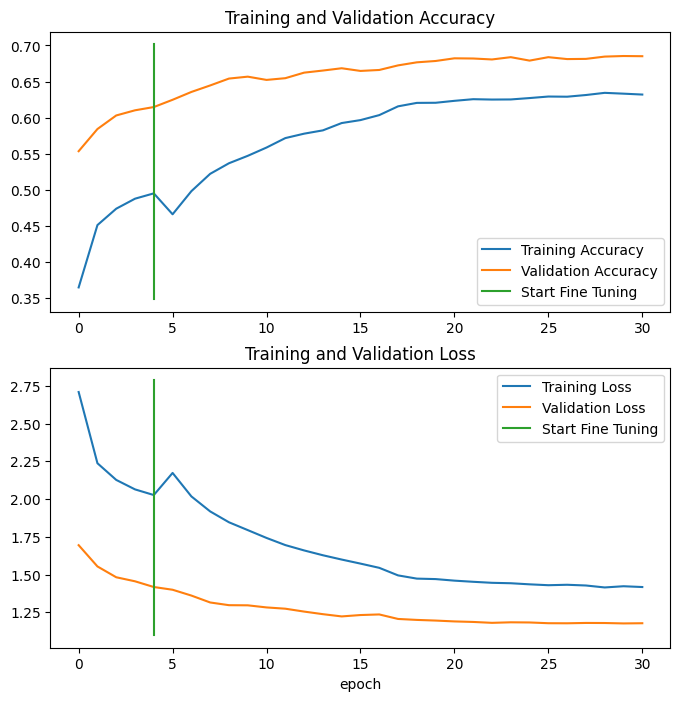

In [60]:
# the validation accuracy increase keeps slowing while training
combine_training_curves(feature_extraction_v2_history, fine_tuning_v2_history, pretraining_epochs=5)

![EfficientNetV2: Smaller Models and Faster Training](../assets/04_Tensorflow_Transfer_Learning_29.png)

#### Predictions

In [61]:
y_pred = []  # store predicted labels
y_true = []  # store true labels

# iterate over the dataset
for image_batch, label_batch in testing_dataset:   # use dataset.unbatch() with repeat
   # append true labels
   y_true.append(label_batch)
   # compute predictions
   preds = model_v2.predict(image_batch)
   # append predicted labels
   y_pred.append(np.argmax(preds, axis = - 1))

# convert the true and predicted labels into tensors
correct_labels = tf.concat([item for item in y_true], axis = 0)
predicted_labels = tf.concat([item for item in y_pred], axis = 0)

1/1 [==============================] - 0s 115ms/step


1/1 [==============================] - 0s 113ms/step


1/1 [==============================] - 5s 5s/step


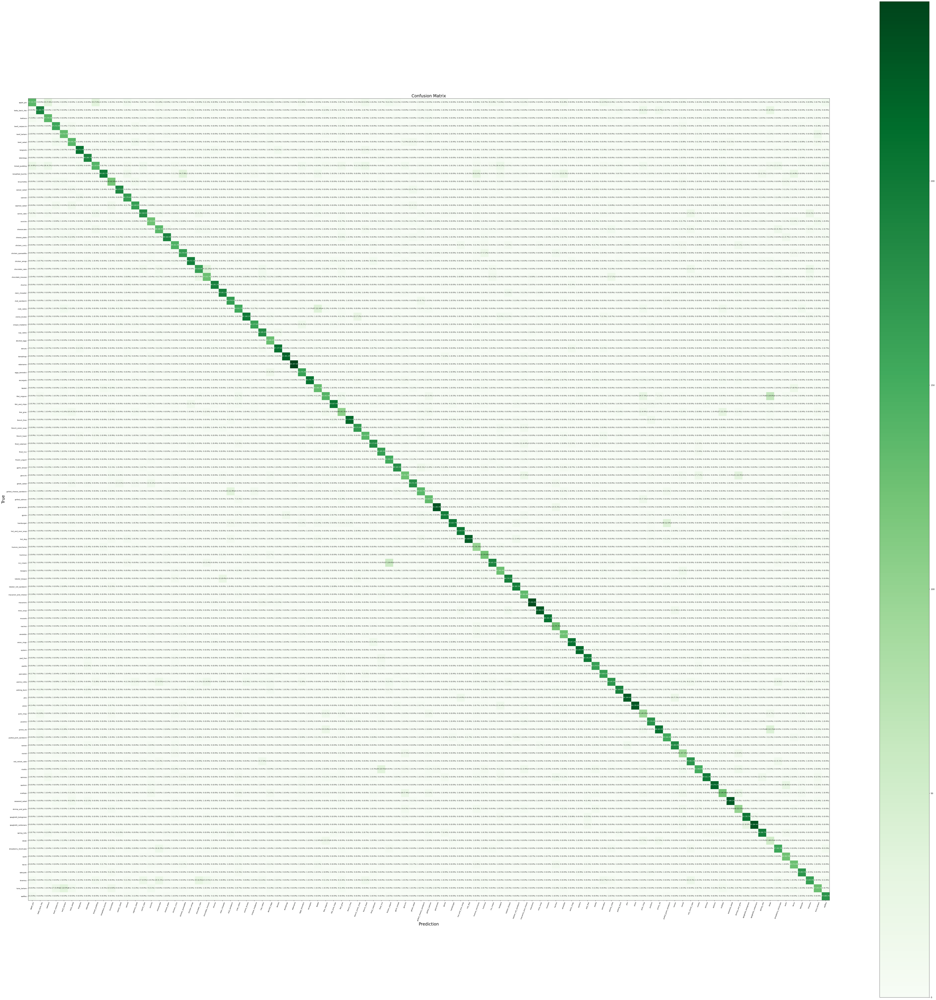

In [62]:
plot_confusion_matrix(y_pred=predicted_labels,
                      y_true=correct_labels,
                      classes=class_names,
                      figsize = (88, 88),
                      text_size=8)

![EfficientNetV2: Smaller Models and Faster Training](../assets/04_Tensorflow_Transfer_Learning_30.png)

In [63]:
# Load TensorBoard
%load_ext tensorboard
%tensorboard --logdir '../tensorboard/food101/'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 83424), started 18:46:17 ago. (Use '!kill 83424' to kill it.)

![EfficientNetV2: Smaller Models and Faster Training](../assets/04_Tensorflow_Transfer_Learning_31.png)

![EfficientNetV2: Smaller Models and Faster Training](../assets/04_Tensorflow_Transfer_Learning_32.png)

In [64]:
# save the full model
model_v2.save('../saved_models/food101_env2m_30epochs')

# TypeError: Unable to serialize [2.0896919 2.1128857 2.1081853] to JSON. Unrecognized type <class 'tensorflow.python.framework.ops.EagerTensor'>.
# tf.__version__ '2.11.0'

INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1, 1, 1152, 320), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7fad400bcee0>, 140389004273456), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1, 1, 1152, 320), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7fad400bcee0>, 140389004273456), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1, 1, 320, 1280), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7fad400e7460>, 140389004548640), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1, 1, 320, 1280), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7fad400e7460>, 140389004548640), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1280, 101), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7fad401393f0>, 140389288787632), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1280, 101), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7fad401393f0>, 140389288787632), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(101,), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7fad4013b3a0>, 140388893401136), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(101,), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7fad4013b3a0>, 140388893401136), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1, 1, 1152, 320), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7fad400bcee0>, 140389004273456), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1, 1, 1152, 320), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7fad400bcee0>, 140389004273456), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1, 1, 320, 1280), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7fad400e7460>, 140389004548640), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1, 1, 320, 1280), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7fad400e7460>, 140389004548640), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1280, 101), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7fad401393f0>, 140389288787632), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1280, 101), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7fad401393f0>, 140389288787632), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(101,), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7fad4013b3a0>, 140388893401136), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(101,), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7fad4013b3a0>, 140388893401136), {}).


INFO:tensorflow:Assets written to: ../saved_models/food101_env2m_30epochs/assets


INFO:tensorflow:Assets written to: ../saved_models/food101_env2m_30epochs/assets


TypeError: Unable to serialize [2.0896919 2.1128857 2.1081853] to JSON. Unrecognized type <class 'tensorflow.python.framework.ops.EagerTensor'>.

## Decreasing Complexity

In the last experiment I changed 2 parameters:

1. EfficientNet v1 => EfficientNet v2
2. EfficientNetB0 => EfficientNetM

And the results I am seeing a very similar. So now I want to try EfficientNetB0 v2 to decrease the complexity of the model and see how this affects the performance.

In [10]:
# load the version 2 base model
base_model_v2_b0 = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)
base_model_v2_b0.trainable = False

In [11]:
# create augmented functional model
inputs = layers.Input(shape=(IMG_DIM, IMG_DIM, 3), name="input_layer")
x = data_augmentation_layer_no_rescaling(inputs)
# normalization not needed for EfficientNet models
# x = layers.Rescaling(1./255)(x)
# freeze base layers in inference mode
x = base_model_v2_b0(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(len(class_names))(x)
# mixed precision requires outputlayer to be of dtype = tf.float32
# above mixed mixed float16 / below float32 separation
outputs = layers.Activation("softmax", dtype=tf.float32, name="softmax_output_float32")(x)
model_v2_b0 = tf.keras.Model(inputs, outputs)

# labels are not 1-hot encoded => sparse_categorical instead of categorical
model_v2_b0.compile(loss="sparse_categorical_crossentropy",
             optimizer= tf.keras.optimizers.Adam(learning_rate=1e-3),
             metrics=["accuracy"])

In [12]:
tf.random.set_seed(SEED)
feature_extraction_v2_b0_epochs = 10

feature_extraction_v2_b0_history = model_v2_b0.fit(training_dataset,
                                             epochs=feature_extraction_v2_b0_epochs,
                                             steps_per_epoch=len(training_dataset),
                                             validation_data=testing_dataset,
                                             # evaluate performance on 15% of the testing dataset
                                             validation_steps=int(0.15 * len(testing_dataset)),
                                             callbacks=[tensorboard_v2_b0_callback,
                                                        checkpoint_v2_b0_callback,
                                                        reduce_learning_rate_callback,
                                                        early_stop_callback])

# Epoch 1/15
# 665s 275ms/step - loss: 2.6137 - accuracy: 0.3792 - val_loss: 1.6742 - val_accuracy: 0.5556 - lr: 0.0010
# Epoch 2/10
# 651s 275ms/step - loss: 2.1238 - accuracy: 0.4749 - val_loss: 1.5503 - val_accuracy: 0.5805 - lr: 0.0010
# Epoch 3/10
# 645s 272ms/step - loss: 1.9973 - accuracy: 0.5008 - val_loss: 1.4839 - val_accuracy: 0.6004 - lr: 0.0010
# Epoch 4/10
# 624s 263ms/step - loss: 1.9342 - accuracy: 0.5164 - val_loss: 1.4592 - val_accuracy: 0.5985 - lr: 0.0010
# Epoch 5/10
# 636s 268ms/step - loss: 1.8739 - accuracy: 0.5274 - val_loss: 1.4295 - val_accuracy: 0.6099 - lr: 0.0010
# Epoch 6/10
# 623s 263ms/step - loss: 1.8362 - accuracy: 0.5380 - val_loss: 1.4357 - val_accuracy: 0.6096 - lr: 0.0010
# Epoch 7/10
# 570s 240ms/step - loss: 1.8121 - accuracy: 0.5416 - val_loss: 1.3968 - val_accuracy: 0.6200 - lr: 0.0010
# Epoch 8/10
# 566s 239ms/step - loss: 1.7965 - accuracy: 0.5447 - val_loss: 1.3965 - val_accuracy: 0.6176 - lr: 0.0010
# Epoch 9/10
# 555s 234ms/step - loss: 1.7713 - accuracy: 0.5497 - val_loss: 1.4094 - val_accuracy: 0.6104 - lr: 0.0010
# Epoch 10/10
# ETA: 0s - loss: 1.7563 - accuracy: 0.5540
# Epoch 10: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
# 548s 231ms/step - loss: 1.7562 - accuracy: 0.5540 - val_loss: 1.4167 - val_accuracy: 0.6152 - lr: 0.0010


Epoch 1/10


2023-03-21 19:09:00.814371: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8600
2023-03-21 19:09:02.995052: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7f70f80461e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-03-21 19:09:02.995078: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA GeForce GTX 1060 6GB, Compute Capability 6.1
2023-03-21 19:09:03.001600: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-03-21 19:09:03.002135: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.
2023-03-21 19:09:03.116472: I tensorflow/compiler/jit/xla_compilation_cache.cc:477] Compiled cluster using XLA!  This line is logged at most o

2368/2368 [==============================] - 665s 275ms/step - loss: 2.6137 - accuracy: 0.3792 - val_loss: 1.6742 - val_accuracy: 0.5556 - lr: 0.0010
Epoch 2/10
2368/2368 [==============================] - 651s 275ms/step - loss: 2.1238 - accuracy: 0.4749 - val_loss: 1.5503 - val_accuracy: 0.5805 - lr: 0.0010
Epoch 3/10
2368/2368 [==============================] - 645s 272ms/step - loss: 1.9973 - accuracy: 0.5008 - val_loss: 1.4839 - val_accuracy: 0.6004 - lr: 0.0010
Epoch 4/10
2368/2368 [==============================] - 624s 263ms/step - loss: 1.9342 - accuracy: 0.5164 - val_loss: 1.4592 - val_accuracy: 0.5985 - lr: 0.0010
Epoch 5/10
2368/2368 [==============================] - 636s 268ms/step - loss: 1.8739 - accuracy: 0.5274 - val_loss: 1.4295 - val_accuracy: 0.6099 - lr: 0.0010
Epoch 6/10
2368/2368 [==============================] - 623s 263ms/step - loss: 1.8362 - accuracy: 0.5380 - val_loss: 1.4357 - val_accuracy: 0.6096 - lr: 0.0010
Epoch 7/10
2368/2368 [=======================

In [13]:
# unfreeze entire model
base_model_v2_b0.trainable = True

# keep only the last 5 layers trainable
for layer in base_model_v2_b0.layers[:-5]:
    layer.trainable = False

In [14]:
# recompile the model with the new basemodel
model_v2_b0.compile(loss='sparse_categorical_crossentropy',
               optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
               metrics=['accuracy'])

In [15]:
# continue training
tf.random.set_seed(SEED)
fine_tuning_v2_b0_epochs = feature_extraction_v2_b0_epochs + 25

fine_tuning_v2_b0_history = model_v2_b0.fit(
                            training_dataset,
                            epochs=fine_tuning_v2_b0_epochs,
                            # start from last pre-training checkpoint
                            # training from epoch 6 - 10
                            initial_epoch = feature_extraction_v2_b0_history.epoch[-1],
                            steps_per_epoch=len(training_dataset),
                            validation_data=testing_dataset,
                            # evaluate performance on 15% of the testing dataset
                            validation_steps=int(0.15 * len(testing_dataset)),
                            callbacks=[tensorboard_v2_b0_callback,
                                       checkpoint_v2_b0_callback,
                                       reduce_learning_rate_callback,
                                       early_stop_callback])

Epoch 10/35


2368/2368 [==============================] - 678s 281ms/step - loss: 1.6473 - accuracy: 0.5786 - val_loss: 1.3596 - val_accuracy: 0.6364 - lr: 1.0000e-04
Epoch 11/35
2368/2368 [==============================] - 681s 287ms/step - loss: 1.5833 - accuracy: 0.5920 - val_loss: 1.3119 - val_accuracy: 0.6409 - lr: 1.0000e-04
Epoch 12/35
2368/2368 [==============================] - 819s 346ms/step - loss: 1.5324 - accuracy: 0.6047 - val_loss: 1.3108 - val_accuracy: 0.6377 - lr: 1.0000e-04
Epoch 13/35
2368/2368 [==============================] - 770s 325ms/step - loss: 1.4999 - accuracy: 0.6132 - val_loss: 1.3115 - val_accuracy: 0.6427 - lr: 1.0000e-04
Epoch 14/35
2367/2368 [============================>.] - ETA: 0s - loss: 1.4660 - accuracy: 0.6204
Epoch 14: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.
2368/2368 [==============================] - 674s 284ms/step - loss: 1.4661 - accuracy: 0.6203 - val_loss: 1.3113 - val_accuracy: 0.6433 - lr: 1.0000e-04
Epoch 15/35
2368/

In [43]:
# save the full model
model_v2_b0.save('../saved_models/food101_env2b0_35epochs')

INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1, 1, 192, 1280), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f70f5d0ee30>, 140125381173104), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1, 1, 192, 1280), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f70f5d0ee30>, 140125381173104), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1280, 101), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f70f5d4d3f0>, 140123827058080), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1280, 101), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f70f5d4d3f0>, 140123827058080), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(101,), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f70f5d4f400>, 140123827058240), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(101,), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f70f5d4f400>, 140123827058240), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1, 1, 192, 1280), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f70f5d0ee30>, 140125381173104), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1, 1, 192, 1280), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f70f5d0ee30>, 140125381173104), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1280, 101), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f70f5d4d3f0>, 140123827058080), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(1280, 101), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f70f5d4d3f0>, 140123827058080), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(101,), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f70f5d4f400>, 140123827058240), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(101,), dtype=tf.float32, name='gradient'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f70f5d4f400>, 140123827058240), {}).


INFO:tensorflow:Assets written to: ../saved_models/food101_env2b0_35epochs/assets


INFO:tensorflow:Assets written to: ../saved_models/food101_env2b0_35epochs/assets


### Model Training Evaluation

#### Accuracy and Loss

10
32
[0.37918150424957275, 0.47487789392471313, 0.5007656812667847, 0.5163564085960388, 0.5274191498756409, 0.5379933714866638, 0.5415577292442322, 0.5447260737419128, 0.5497161746025085, 0.5540198087692261, 0.5785874724388123, 0.5920395851135254, 0.6047128438949585, 0.6132277250289917, 0.6203300356864929, 0.6314059495925903, 0.6347854733467102, 0.6377161741256714, 0.6379669904708862, 0.6403696537017822, 0.6417953968048096, 0.6416633725166321, 0.6416237354278564, 0.6437227725982666, 0.6401452422142029, 0.6445016264915466, 0.6447128653526306, 0.6417425870895386, 0.6436567902565002, 0.6420990228652954, 0.6444752216339111, 0.6431419253349304]


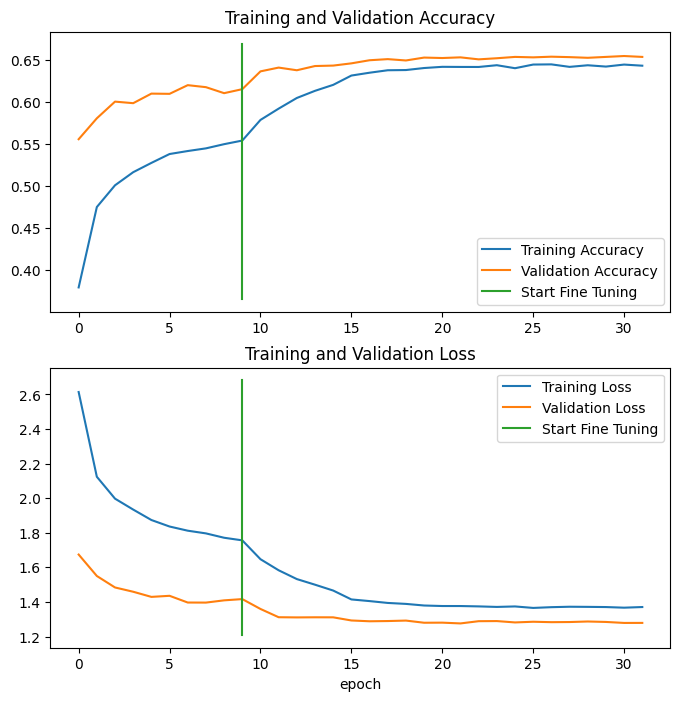

In [16]:
combine_training_curves(feature_extraction_v2_b0_history, fine_tuning_v2_b0_history, pretraining_epochs=10)

![Keras Applications & Tensorflow Datasets](./assets/04_Tensorflow_Transfer_Learning_33.png)

### Test Prediction Evaluation

In [18]:
# confusion matrix
y_pred = []  # store predicted labels
y_true = []  # store true labels

# iterate over the dataset
for image_batch, label_batch in testing_dataset:   # use dataset.unbatch() with repeat
   # append true labels
   y_true.append(label_batch)
   # compute predictions
   preds = model_v2_b0.predict(image_batch)
   # append predicted labels
   y_pred.append(np.argmax(preds, axis = - 1))

# convert the true and predicted labels into tensors
correct_labels = tf.concat([item for item in y_true], axis = 0)
predicted_labels = tf.concat([item for item in y_pred], axis = 0)

1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 25ms/step


1/1 [==============================] - 2s 2s/step


(<tf.Tensor: shape=(25250,), dtype=int64, numpy=array([ 78, 100,  79, ...,  53,  11,  87])>,
 <tf.Tensor: shape=(25250,), dtype=int64, numpy=array([  8, 100,  79, ...,  53,  11,  87])>)

#### Confusion Matrix

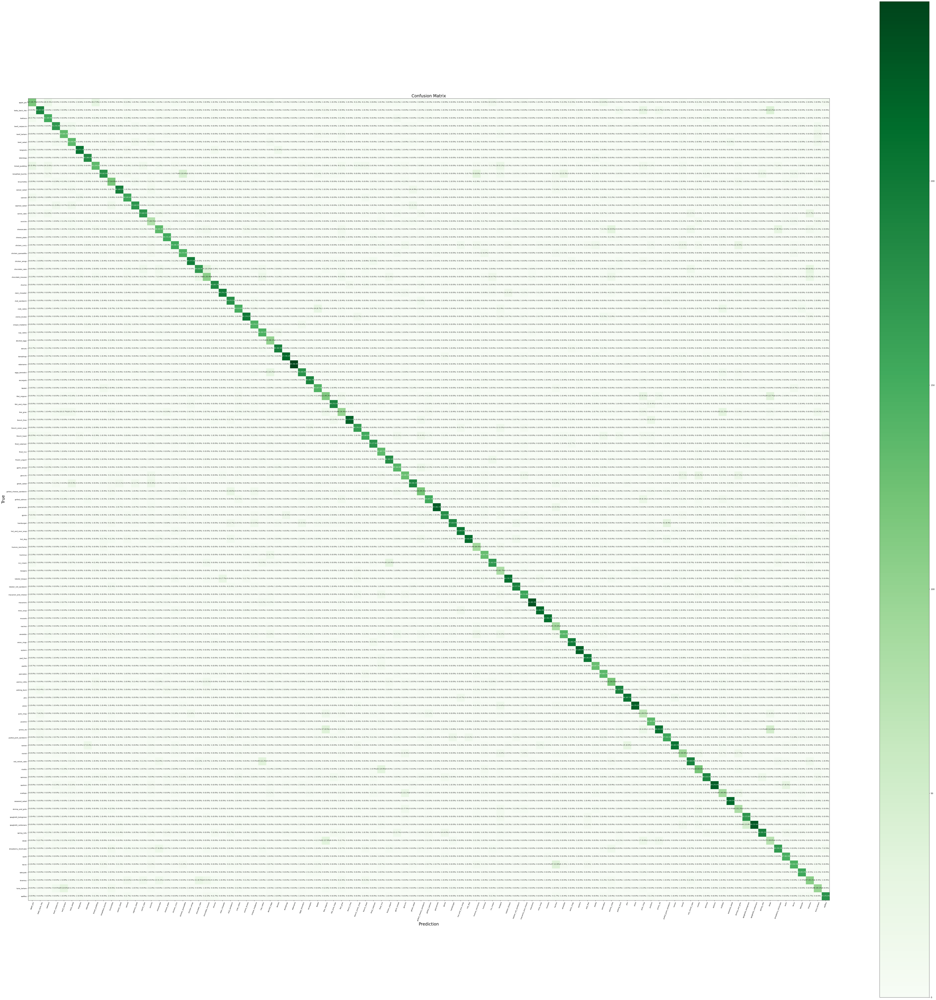

In [19]:
plot_confusion_matrix(y_pred=predicted_labels,
                      y_true=correct_labels,
                      classes=class_names,
                      figsize = (88, 88),
                      text_size=8)

![Keras Applications & Tensorflow Datasets](./assets/04_Tensorflow_Transfer_Learning_34.png)

#### F1 Scores for Labels

In [22]:
# visualizing the F1 scores per class
classification_report_dict = classification_report(y_true=predicted_labels,
                                                  y_pred=correct_labels,
                                                  output_dict=True)


# extract f1-scores from dictionary
class_f1_scores = {}

## loop through classification report
for k, v in classification_report_dict.items():
    # stop when you reach end of table => class# = accuracy
    if k == "accuracy":
        break
    else:
        # get class name and f1 score for class #
        class_f1_scores[class_names[int(k)]] = v["f1-score"]

# write it into a dataframe
f1_scores = pd.DataFrame({"classname": list(class_f1_scores.keys()),
                         "f1-score": list(class_f1_scores.values())}).sort_values("f1-score", ascending=False)

print(f1_scores)

           classname  f1-score
33           edamame  0.972112
88     seaweed_salad  0.898129
69           oysters  0.895582
63          macarons  0.892308
65           mussels  0.883333
..               ...       ...
22  chocolate_mousse  0.383912
39         foie_gras  0.377649
15           ceviche  0.364066
93             steak  0.333333
77         pork_chop  0.316547

[101 rows x 2 columns]


|    | classname | f1-score |
| -- | -- | -- |
| 33 |           edamame |  0.972112 |
| 88 |     seaweed_salad |  0.898129 |
| 69 |           oysters |  0.895582 |
| 63 |          macarons |  0.892308 |
| 65 |           mussels |  0.883333 |
| .. |               ... |       ... |
| 22 |  chocolate_mousse |  0.383912 |
| 39 |         foie_gras |  0.377649 |
| 15 |           ceviche |  0.364066 |
| 93 |             steak |  0.333333 |
| 77 |         pork_chop |  0.316547 |

`[101 rows x 2 columns]`

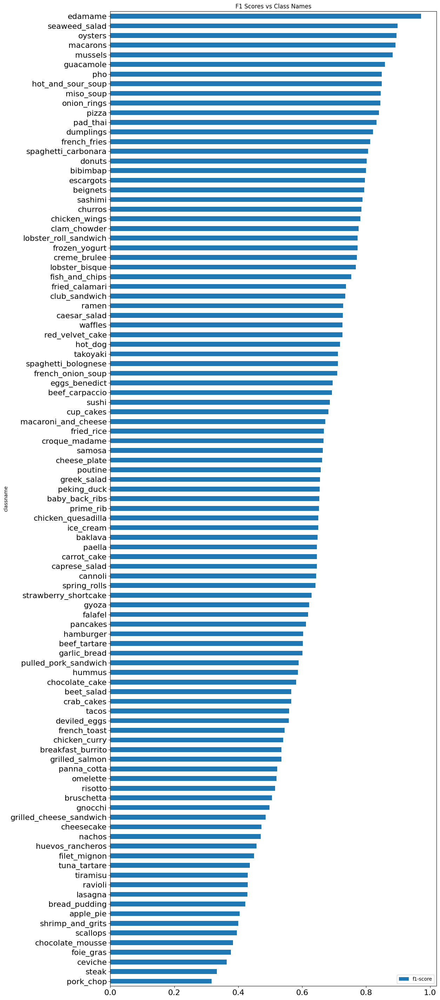

In [23]:
f1_scores_inverse = f1_scores.sort_values(by=['f1-score'])
f1_bar_chart = f1_scores_inverse.plot.barh(x='classname',
                                  y='f1-score', fontsize=16,
                                  title="F1 Scores vs Class Names",
                                  rot=0, legend=True,
                                  figsize=(12,36))

![Keras Applications & Tensorflow Datasets](./assets/04_Tensorflow_Transfer_Learning_35.png)

#### Find Wrong Predictions with Highest Confidence

In [26]:
# making predictions on all 25250 validation images for 101 classes
test_prediction_probabilities = model_v2_b0.predict(testing_dataset, verbose=1)
print(test_prediction_probabilities.shape)
# (25250, 101)

790/790 [==============================] - 47s 57ms/step
(25250, 101)


In [27]:
# find false prediction that have the highest confidence
prediction_quality = pd.DataFrame({"y_true": correct_labels,
                                  "y_pred": predicted_labels,
                                  "pred_conf": test_prediction_probabilities.max(axis=1),
                                  "y_true_classname": [class_names[i] for i in correct_labels],
                                  "y_pred_classname": [class_names[i] for i in predicted_labels]})

prediction_quality

,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname
0,78,8,0.679352,poutine,bread_pudding
1,100,100,0.849204,waffles,waffles
2,79,79,0.866372,prime_rib,prime_rib
3,4,4,0.803154,beef_tartare,beef_tartare
4,37,42,0.990849,filet_mignon,french_toast
...,...,...,...,...,...
25245,53,53,0.700280,hamburger,hamburger
25246,13,13,0.944595,caprese_salad,caprese_salad
25247,53,53,0.362593,hamburger,hamburger
25248,11,11,0.998997,caesar_salad,caesar_salad


|    | y_true | y_pred | pred_conf | y_true_classname | y_pred_classname |
| -- |   --   |  --    |    --     |       --         |       --         |
| 0 | 	78 | 	8 | 	0.679352 | 	poutine | 	bread_pudding |
| 1 | 	100 | 	100 | 	0.849204 | 	waffles | 	waffles |
| 2 | 	79 | 	79 | 	0.866372 | 	prime_rib | 	prime_rib |
| 3 | 	4 | 	4 | 	0.803154 | 	beef_tartare | 	beef_tartare |
| 4 | 	37 | 	42 | 	0.990849 | 	filet_mignon | 	french_toast |
| ... | 	... | 	... | 	... | 	... | 	... |
| 25245 | 	53 | 	53 | 	0.700280 | 	hamburger | 	hamburger |
| 25246 | 	13 | 	13 | 	0.944595 | 	caprese_salad | 	caprese_salad |
| 25247 | 	53 | 	53 | 	0.362593 | 	hamburger | 	hamburger |
| 25248 | 	11 | 	11 | 	0.998997 | 	caesar_salad | 	caesar_salad |
| 25249 | 	87 | 	87 | 	0.985820 | 	scallops | 	scallops |

`25250 rows × 5 columns`

In [28]:
# add bool comlumn for correct predictions
prediction_quality["pred_correct"] = prediction_quality["y_true"] == prediction_quality["y_pred"]

In [29]:
# create new dataframe with the 100 most wrong predictions
top_100_wrong = prediction_quality[prediction_quality["pred_correct"] == False].sort_values("pred_conf", ascending=False)[:100]
top_100_wrong

,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
21045,66,67,1.000000,nachos,omelette,False
610,7,41,1.000000,bibimbap,french_onion_soup,False
15468,68,96,1.000000,onion_rings,tacos,False
24295,35,86,1.000000,escargots,sashimi,False
20157,42,50,1.000000,french_toast,grilled_salmon,False
...,...,...,...,...,...,...
12150,89,0,0.999972,shrimp_and_grits,apple_pie,False
15385,95,61,0.999972,sushi,lobster_roll_sandwich,False
10664,71,67,0.999972,paella,omelette,False
23552,89,18,0.999969,shrimp_and_grits,chicken_curry,False


| 	    | y_true | y_pred |	pred_conf | y_true_classname | y_pred_classname | pred_correct |
| -- | 	-- | -- | 	-- | 	-- | --  | 	-- |
| 21045 | 	66 | 	67 | 	1.000000 | 	nachos | 	omelette | 	False |
| 610 | 	7 | 	41 | 	1.000000 | 	bibimbap | 	french_onion_soup | 	False |
| 15468 | 	68 | 	96 | 	1.000000 | 	onion_rings | 	tacos | 	False |
| 24295 | 	35 | 	86 | 	1.000000 | 	escargots | 	sashimi | 	False |
| 20157 | 	42 | 	50 | 	1.000000 | 	french_toast | 	grilled_salmon | 	False |
| ... | 	... | 	... | 	... | 	... | 	... | 	... |
| 12150 | 	89 | 	0 | 	0.999972 | 	shrimp_and_grits | 	apple_pie | 	False |
| 15385 | 	95 | 	61 | 	0.999972 | 	sushi | 	lobster_roll_sandwich | 	False |
| 10664 | 	71 | 	67 | 	0.999972 | 	paella | 	omelette | 	False |
| 23552 | 	89 | 	18 | 	0.999969 | 	shrimp_and_grits | 	chicken_curry | 	False |
| 8587 | 	85 | 	0 | 	0.999969 | 	samosa | 	apple_pie | 	False |

In [38]:
# what predictions are most often wrong
grouped_top_100_wrong_pred = top_100_wrong.groupby(['y_pred', 'y_pred_classname']).agg(', '.join).reset_index()
pd.set_option('display.max_colwidth', None)
grouped_top_100_wrong_pred[:50]

/tmp/ipykernel_246913/2709000191.py:2: FutureWarning: Dropping invalid columns in DataFrameGroupBy.agg is deprecated. In a future version, a TypeError will be raised. Before calling .agg, select only columns which should be valid for the function.
  grouped_top_100_wrong_pred = top_100_wrong.groupby(['y_pred', 'y_pred_classname']).agg(', '.join).reset_index()


,y_pred,y_pred_classname,y_true_classname
0,0,apple_pie,"pancakes, miso_soup, risotto, grilled_cheese_sandwich, shrimp_and_grits, samosa"
1,1,baby_back_ribs,steak
2,3,beef_carpaccio,"beef_tartare, caesar_salad"
3,5,beet_salad,"beef_carpaccio, deviled_eggs"
4,6,beignets,ravioli
5,8,bread_pudding,"pork_chop, strawberry_shortcake, strawberry_shortcake, beet_salad"
6,9,breakfast_burrito,"huevos_rancheros, lasagna, chicken_quesadilla, omelette"
7,10,bruschetta,"tuna_tartare, huevos_rancheros"
8,12,cannoli,"tuna_tartare, carrot_cake"
9,15,ceviche,beet_salad


|   | y_pred | y_pred_classname | y_true_classname |
| -- | -- | -- | -- |
| 0 |	0 	 | apple_pie | pancakes, miso_soup, risotto, grilled_cheese_sandwich, shrimp_and_grits, samosa |
| 1 | 1 | baby_back_ribs |	steak |
| 2 | 3 | beef_carpaccio |	beef_tartare, caesar_salad |
| 3 | 5 | beet_salad |	beef_carpaccio, deviled_eggs |
| 4 | 6 | beignets |	ravioli |
| 5 | 8 | bread_pudding |	pork_chop, strawberry_shortcake, strawberry_shortcake, beet_salad |
| 6 | 9 | breakfast_burrito |	huevos_rancheros, lasagna, chicken_quesadilla, omelette |
| 7 | 10 | bruschetta |	tuna_tartare, huevos_rancheros |
| 8 | 12 | cannoli |	tuna_tartare, carrot_cake |
| 9 | 15 | ceviche |	beet_salad |
| 10 | 17 | cheese_plate |	sashimi, grilled_cheese_sandwich |
| 11 | 18 | chicken_curry |	ravioli, shrimp_and_grits |
| 12 | 20 | chicken_wings |	french_fries, peking_duck |
| 13 | 21 | chocolate_cake |	chocolate_mousse, chocolate_mousse, grilled_salmon |
| 14 | 22 | chocolate_mousse |	apple_pie |
| 15 | 26 | crab_cakes |	foie_gras |
| 16 | 27 | creme_brulee |	pancakes |
| 17 | 37 | filet_mignon |	steak, tuna_tartare, chocolate_cake, prime_rib |
| 18 | 38 | fish_and_chips |	pulled_pork_sandwich |
| 19 | 39 | foie_gras |	apple_pie, shrimp_and_grits |
| 20 | 41 | french_onion_soup |	bibimbap |
| 21 | 42 | french_toast |	cheesecake, huevos_rancheros, churros, waffles |
| 22 | 45 | frozen_yogurt |	baklava |
| 23 | 46 | garlic_bread |	dumplings |
| 24 | 47 | gnocchi |	ravioli |
| 25 | 48 | greek_salad |	caesar_salad |
| 26 | 49 | grilled_cheese_sandwich |	chicken_quesadilla, hummus, bruschetta, garlic_bread |
| 27 | 50 | grilled_salmon |	french_toast, crab_cakes |
| 28 | 52 | gyoza |	chicken_quesadilla, grilled_cheese_sandwich |
| 29 | 53 | hamburger |	club_sandwich, onion_rings |
| 30 | 55 | hot_dog |	tacos |
| 31 | 56 | huevos_rancheros |	omelette |
| 32 | 58 | ice_cream |	macaroni_and_cheese, frozen_yogurt |
| 33 | 60 | lobster_bisque |	peking_duck |
| 34 | 61 | lobster_roll_sandwich |	sushi |
| 35 | 64 | miso_soup |	french_onion_soup |
| 36 | 67 | omelette |	nachos, caesar_salad, paella |
| 37 | 74 | peking_duck |	frozen_yogurt, oysters |
| 38 | 77 | pork_chop |	chicken_wings |
| 39 | 79 | prime_rib |	baby_back_ribs, steak |
| 40 | 81 | ramen |	pho |
| 41 | 82 | ravioli |	gnocchi, gnocchi |
| 42 | 83 | red_velvet_cake |	strawberry_shortcake, panna_cotta |
| 43 | 84 | risotto |	ravioli |
| 44 | 85 | samosa |	tuna_tartare, breakfast_burrito |
| 45 | 86 | sashimi |	escargots, strawberry_shortcake, hummus |
| 46 | 91 | spaghetti_carbonara |	spaghetti_bolognese |
| 47 | 92 | spring_rolls |	fish_and_chips, huevos_rancheros |
| 48 | 93 | steak |	baby_back_ribs, bread_pudding, foie_gras |
| 49 | 96 | tacos |	onion_rings |
| 50 | 97 | takoyaki |	spaghetti_bolognese |
| 51 | 98 | tiramisu |	cannoli, chocolate_mousse |
| 52 | 100 | waffles |	nachos |

In [39]:
# what classes cause the most wrong predictions
grouped_top_100_wrong_cause = top_100_wrong.groupby(['y_true', 'y_true_classname']).agg(', '.join).reset_index()
grouped_top_100_wrong_cause[:50]

/tmp/ipykernel_246913/4116898497.py:2: FutureWarning: Dropping invalid columns in DataFrameGroupBy.agg is deprecated. In a future version, a TypeError will be raised. Before calling .agg, select only columns which should be valid for the function.
  grouped_top_100_wrong_cause = top_100_wrong.groupby(['y_true', 'y_true_classname']).agg(', '.join).reset_index()


,y_true,y_true_classname,y_pred_classname
0,0,apple_pie,"foie_gras, chocolate_mousse"
1,1,baby_back_ribs,"prime_rib, steak"
2,2,baklava,frozen_yogurt
3,3,beef_carpaccio,beet_salad
4,4,beef_tartare,beef_carpaccio
5,5,beet_salad,"ceviche, bread_pudding"
6,7,bibimbap,french_onion_soup
7,8,bread_pudding,steak
8,9,breakfast_burrito,samosa
9,10,bruschetta,grilled_cheese_sandwich


|   | y_true | y_true_classname | y_pred_classname |
| -- | -- | -- | -- |
| 0 | 0 | apple_pie | foie_gras, chocolate_mousse |
| 1 | 1 | baby_back_ribs | prime_rib, steak |
| 2 | 2 | baklava | frozen_yogurt |
| 3 | 3 | beef_carpaccio | beet_salad |
| 4 | 4 | beef_tartare | beef_carpaccio |
| 5 | 5 | beet_salad | ceviche, bread_pudding |
| 6 | 7 | bibimbap | french_onion_soup |
| 7 | 8 | bread_pudding | steak |
| 8 | 9 | breakfast_burrito | samosa |
| 9 | 10 | bruschetta | grilled_cheese_sandwich |
| 10 | 11 | caesar_salad | omelette, greek_salad, beef_carpaccio |
| 11 | 12 | cannoli | tiramisu |
| 12 | 14 | carrot_cake | cannoli |
| 13 | 16 | cheesecake | french_toast |
| 14 | 19 | chicken_quesadilla | grilled_cheese_sandwich, breakfast_burrito, gyoza |
| 15 | 20 | chicken_wings | pork_chop |
| 16 | 21 | chocolate_cake | filet_mignon |
| 17 | 22 | chocolate_mousse | chocolate_cake, chocolate_cake, tiramisu |
| 18 | 23 | churros | french_toast |
| 19 | 25 | club_sandwich | hamburger |
| 20 | 26 | crab_cakes | grilled_salmon |
| 21 | 30 | deviled_eggs | beet_salad |
| 22 | 32 | dumplings | garlic_bread |
| 23 | 35 | escargots | sashimi |
| 24 | 38 | fish_and_chips | spring_rolls |
| 25 | 39 | foie_gras | crab_cakes, steak |
| 26 | 40 | french_fries | chicken_wings |
| 27 | 41 | french_onion_soup | miso_soup |
| 28 | 42 | french_toast | grilled_salmon |
| 29 | 45 | frozen_yogurt | peking_duck, ice_cream |
| 30 | 46 | garlic_bread | grilled_cheese_sandwich |
| 31 | 47 | gnocchi | ravioli, ravioli |
| 32 | 49 | grilled_cheese_sandwich | cheese_plate, apple_pie, gyoza |
| 33 | 50 | grilled_salmon | chocolate_cake |
| 34 | 56 | huevos_rancheros | bruschetta, french_toast, breakfast_burrito, spring_rolls |
| 35 | 57 | hummus | grilled_cheese_sandwich, sashimi |
| 36 | 59 | lasagna | breakfast_burrito |
| 37 | 62 | macaroni_and_cheese | ice_cream |
| 38 | 64 | miso_soup | apple_pie |
| 39 | 66 | nachos | omelette, waffles |
| 40 | 67 | omelette | huevos_rancheros, breakfast_burrito |
| 41 | 68 | onion_rings | tacos, hamburger |
| 42 | 69 | oysters | peking_duck |
| 43 | 71 | paella | omelette |
| 44 | 72 | pancakes | apple_pie, creme_brulee |
| 45 | 73 | panna_cotta | red_velvet_cake |
| 46 | 74 | peking_duck | lobster_bisque, chicken_wings |
| 47 | 75 | pho | ramen |
| 48 | 77 | pork_chop | bread_pudding |
| 49 | 79 | prime_rib | filet_mignon |

### Run Custom Predictions

In [40]:
# get list of custom image file paths
custom_images_path = "../datasets/custom_images/"
custom_images = [ custom_images_path + img_path for img_path in os.listdir(custom_images_path)]
custom_images

# ['../datasets/custom_images/cheesecake.jpg',
#  '../datasets/custom_images/crema_catalana.jpg',
#  '../datasets/custom_images/fish_and_chips.jpg',
#  '../datasets/custom_images/jiaozi.jpg',
#  '../datasets/custom_images/paella.jpg',
#  '../datasets/custom_images/pho.jpg',
#  '../datasets/custom_images/quesadilla.jpg',
#  '../datasets/custom_images/ravioli.jpg',
#  '../datasets/custom_images/waffles.jpg']

['../datasets/custom_images/cheesecake.jpg',
 '../datasets/custom_images/crema_catalana.jpg',
 '../datasets/custom_images/fish_and_chips.jpg',
 '../datasets/custom_images/jiaozi.jpg',
 '../datasets/custom_images/paella.jpg',
 '../datasets/custom_images/pho.jpg',
 '../datasets/custom_images/quesadilla.jpg',
 '../datasets/custom_images/ravioli.jpg',
 '../datasets/custom_images/waffles.jpg']

1/1 [==============================] - 0s 23ms/step


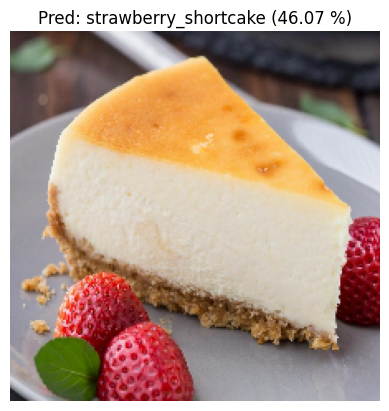

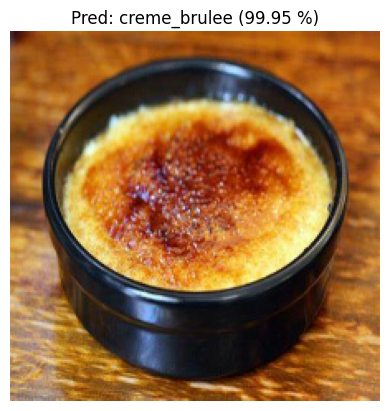

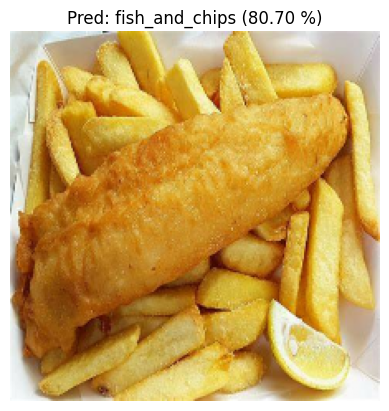

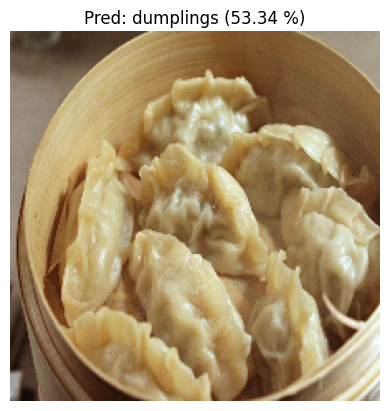

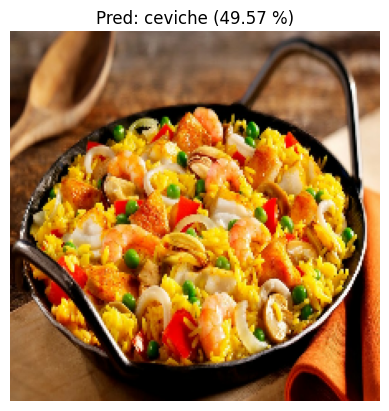

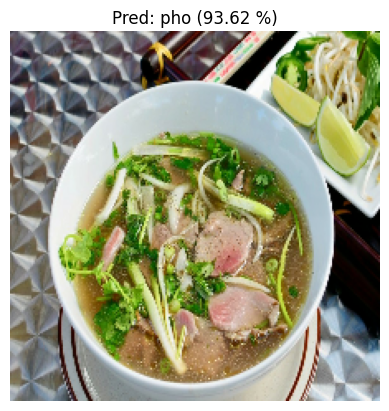

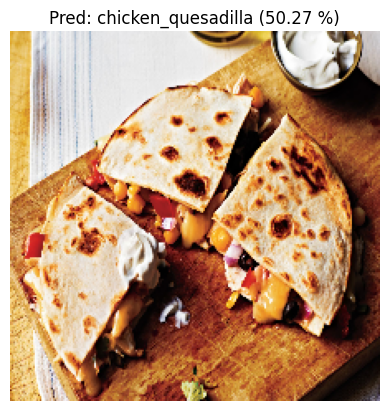

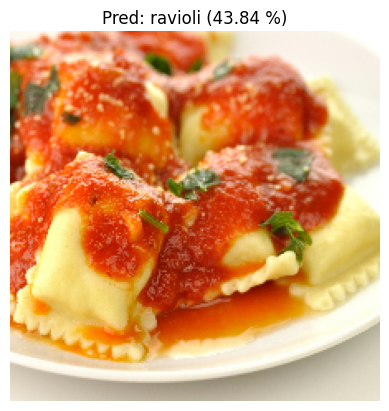

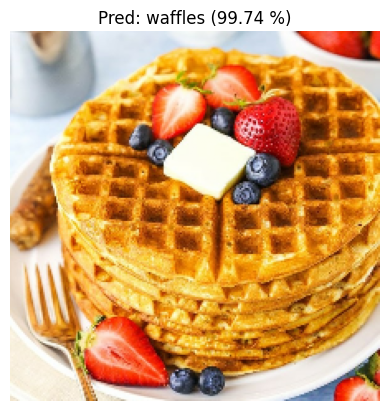

In [42]:
# run prediction on custom images
for image in custom_images:
    image = load_and_preprocess_image(image, normalize=False)
    # test image is (224, 224, 3) but model expects batch shape (None, 224, 224, 3)
    image_expanded = tf.expand_dims(image, axis=0)
    # get probabilities over all classes
    prediction_probabilities = model_v2_b0.predict(image_expanded)
    # get classname for highest probability
    predicted_class =  class_names[prediction_probabilities.argmax()]
    # plot normalized image
    plt.figure()
    plt.imshow(image/255.)
    plt.title(f"Pred: {predicted_class} ({prediction_probabilities.max()*100:.2f} %)")
    plt.axis(False)

![Keras Applications & Tensorflow Datasets](./assets/04_Tensorflow_Transfer_Learning_36.png)